In [1]:
# import library
import matplotlib
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import contextily as ctx
import folium
from folium.plugins import MarkerCluster

# 1. Exploring the full data set again

In [2]:
# bring in the CSV and take a look at it
listing_df = pd.read_csv('data/airbnb-listings.csv')
listing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31900 entries, 0 to 31899
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            31900 non-null  int64  
 1   listing_url                                   31900 non-null  object 
 2   scrape_id                                     31900 non-null  int64  
 3   last_scraped                                  31900 non-null  object 
 4   name                                          31899 non-null  object 
 5   description                                   30751 non-null  object 
 6   neighborhood_overview                         20185 non-null  object 
 7   picture_url                                   31900 non-null  object 
 8   host_id                                       31900 non-null  int64  
 9   host_url                                      31900 non-null 

In [3]:
# plot the listings by neighborhood just to take a look
fig = px.scatter_mapbox(listing_df,
                        lat="latitude",
                        lon="longitude",
                        hover_name="name", 
                        color="neighbourhood_cleansed",
                        #hover_data=["neighborhood_overview"], 
                        mapbox_style="carto-positron",
                        title='Airbnb Listings'
                        )
# show the map
fig.show()

In [4]:
# convert to string and lower case
listing_df['neighborhood_overview']=listing_df.neighborhood_overview.astype(str)
listing_df['neighborhood_overview']=listing_df.neighborhood_overview.str.lower()

In [5]:
# function to check if a listing contains a word
def check_words(description, word):
    if word in description:
        n = True
    else:
        n = False
    return n

In [6]:
#Words for Adjectives: Safe, Quiet, Beautiful, Exclusive, Famous
#Words for Amenities: Restaurants, Shop, Art, Trail, Views
#Words for Mobility: Walk, Drive, Parking

# iterate over a list of keywords
list = ['safe','quiet','beautiful','exclusive','famous','restaurants','shop','art','trail','views','walk','drive','parking']
  
# getting length of list
length = len(list)

In [7]:
# Iterating the index to add them to the filtered df
for i in range(length):
    listing_df[list[i]]=listing_df.neighborhood_overview.apply(lambda x: check_words(x,list[i]))
    
listing_df.sample(20)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
31588,47979362,https://www.airbnb.com/rooms/47979362,20210207181900,2021-02-10,ALICE HOME 22,"""Welcome to our nice home. It is located West ...",nan,https://a0.muscache.com/pictures/68d7bdfa-a7e0...,353445733,https://www.airbnb.com/users/show/353445733,...,False,False,False,False,False,False,False,False,False,False
31068,47742848,https://www.airbnb.com/rooms/47742848,20210207181900,2021-02-09,Bright Venice Beach Room Next Sand Walk Everyw...,Bright Light Filled Beach Room in the heart of...,nan,https://a0.muscache.com/pictures/2b0e371a-e4da...,305737796,https://www.airbnb.com/users/show/305737796,...,False,False,False,False,False,False,False,False,False,False
4440,9173163,https://www.airbnb.com/rooms/9173163,20210207181900,2021-02-10,Pasadena Craftsman in best area,1921 cottage newly painted and decorated. It i...,the madison heights area of pasadena is one of...,https://a0.muscache.com/pictures/6468113c-6e71...,9898515,https://www.airbnb.com/users/show/9898515,...,False,False,True,False,False,False,False,True,False,False
2500,4708239,https://www.airbnb.com/rooms/4708239,20210207181900,2021-02-09,Furnished room minutes from DTLA,Fully furnished private room in a 3BHK for upt...,nan,https://a0.muscache.com/pictures/59117140/05d9...,15973150,https://www.airbnb.com/users/show/15973150,...,False,False,False,False,False,False,False,False,False,False
12149,23188997,https://www.airbnb.com/rooms/23188997,20210207181900,2021-02-09,2bed Contemporary full serviced condo in Holly...,Can t beat location and amenities ! Walking di...,"across street from runyon canyon ,hollywood wa...",https://a0.muscache.com/pictures/0a09efe1-401c...,7782015,https://www.airbnb.com/users/show/7782015,...,False,False,False,True,False,False,False,True,True,False
3562,7223426,https://www.airbnb.com/rooms/7223426,20210207181900,2021-02-09,Peaceful Tropical Garden Guesthouse,Come and be enchanted by this beautiful & peac...,mar vista is a quiet up scale and secure resid...,https://a0.muscache.com/pictures/107181651/459...,3768116,https://www.airbnb.com/users/show/3768116,...,False,False,True,True,False,False,False,False,False,False
6647,13969424,https://www.airbnb.com/rooms/13969424,20210207181900,2021-02-10,Quiet Burbank Home for Business Travelers,"Our place is close to Pavilions, Buena Vista L...",nan,https://a0.muscache.com/pictures/664355ab-aa2d...,83280793,https://www.airbnb.com/users/show/83280793,...,False,False,False,False,False,False,False,False,False,False
1796,3292367,https://www.airbnb.com/rooms/3292367,20210207181900,2021-02-09,"Fantastic Studio in Hollywood,","Renovated Studio apartment, located in the hea...",this studio apartment is in the middle of holl...,https://a0.muscache.com/pictures/42483325/50c4...,16586625,https://www.airbnb.com/users/show/16586625,...,False,True,False,False,True,False,False,True,False,False
5857,12579094,https://www.airbnb.com/rooms/12579094,20210207181900,2021-02-08,Warm and cozy 2 bed house w/ garden,This location is near so many great neighborho...,nan,https://a0.muscache.com/pictures/c2b42fcb-8c02...,68218269,https://www.airbnb.com/users/show/68218269,...,False,False,False,False,False,False,False,False,False,False
30639,47360357,https://www.airbnb.com/rooms/47360357,20210207181900,2021-02-09,"Cozy, Cute, Comfortable, Spacious 1Bd/1Ba full...",Beautiful Serene apartment with such cozy furn...,nan,https://a0.muscache.com/pictures/5dc605b3-9e03...,4948789,https://www.airbnb.com/users/show/4948789,...,False,False,False,False,False,False,False,False,False,False


In [8]:
listing_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31900 entries, 0 to 31899
Data columns (total 87 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            31900 non-null  int64  
 1   listing_url                                   31900 non-null  object 
 2   scrape_id                                     31900 non-null  int64  
 3   last_scraped                                  31900 non-null  object 
 4   name                                          31899 non-null  object 
 5   description                                   30751 non-null  object 
 6   neighborhood_overview                         31900 non-null  object 
 7   picture_url                                   31900 non-null  object 
 8   host_id                                       31900 non-null  int64  
 9   host_url                                      31900 non-null 

In [9]:
# plot the listings by keyword just to take a look
fig = px.scatter_mapbox(listing_df,
                        lat="latitude",
                        lon="longitude",
                        hover_name="name", 
                        color="quiet",
                        color_discrete_sequence=["#ececec", "#e15383"],
                        mapbox_style="carto-positron",
                        title='Airbnb Listings in Quiet Neighborhoods'
                        )
# show the map
fig.show()

# 1.1 group by neighborhood and keywords

In [10]:
def group(keyword):
    by_hoods = listing_df.groupby("neighbourhood_cleansed")[keyword].mean()
    by_hoods_df = pd.DataFrame(by_hoods).reset_index()
    return by_hoods_df

In [11]:
# Group by neighborhood for each of the words
# Words for Adjectives: Safe, Quiet, Beautiful, Exclusive, Famous
# Words for Amenities: Restaurants, Shop, Art, Trail, Views
# Words for Mobility: Walk, Drive, Parking

safe_df = group('safe')
quiet_df = group('quiet')
beautiful_df = group('beautiful')
exclusive_df = group('exclusive')
famous_df = group('famous')
restaurants_df = group('restaurants')
shop_df = group('shop')
art_df = group('art')
trail_df = group('trail')
views_df = group('views')
walk_df = group('walk')
drive_df = group('drive')
parking_df = group('parking')

In [14]:
# join the individual data frames together

hood_words = pd.concat((iDF.set_index('neighbourhood_cleansed') for iDF in [safe_df, quiet_df, beautiful_df, exclusive_df, famous_df, restaurants_df, shop_df, art_df, trail_df, views_df, walk_df, drive_df, parking_df]),
    axis=1, join='inner').reset_index()

hood_words.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 262 entries, 0 to 261
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   neighbourhood_cleansed  262 non-null    object 
 1   safe                    262 non-null    float64
 2   quiet                   262 non-null    float64
 3   beautiful               262 non-null    float64
 4   exclusive               262 non-null    float64
 5   famous                  262 non-null    float64
 6   restaurants             262 non-null    float64
 7   shop                    262 non-null    float64
 8   art                     262 non-null    float64
 9   trail                   262 non-null    float64
 10  views                   262 non-null    float64
 11  walk                    262 non-null    float64
 12  drive                   262 non-null    float64
 13  parking                 262 non-null    float64
dtypes: float64(13), object(1)
memory usage: 28

In [15]:
hood_words.sort_values(by=['beautiful'])

,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Acton,0.000000,0.250000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.0
88,Griffith Park,0.000000,0.222222,0.000000,0.0,0.111111,0.333333,0.222222,0.222222,0.111111,0.111111,0.222222,0.222222,0.0
87,Green Valley,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.111111,0.111111,0.000000,0.000000,0.000000,0.0
86,Green Meadows,0.166667,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.0
194,Sepulveda Basin,0.250000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,West Whittier-Los Nietos,0.142857,0.428571,0.285714,0.0,0.000000,0.142857,0.142857,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
150,North El Monte,0.133333,0.400000,0.333333,0.0,0.000000,0.400000,0.000000,0.200000,0.066667,0.000000,0.400000,0.000000,0.0
2,Agoura Hills,0.119048,0.357143,0.333333,0.0,0.023810,0.285714,0.190476,0.047619,0.166667,0.071429,0.238095,0.190476,0.0
36,Castaic,0.000000,0.615385,0.461538,0.0,0.000000,0.076923,0.076923,0.076923,0.153846,0.076923,0.230769,0.153846,0.0


In [16]:
hood_words.head()

,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Acton,0.000000,0.250000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000
1,Adams-Normandie,0.000000,0.026316,0.000000,0.0,0.000000,0.078947,0.000000,0.052632,0.000000,0.000000,0.052632,0.000000,0.000000
2,Agoura Hills,0.119048,0.357143,0.333333,0.0,0.023810,0.285714,0.190476,0.047619,0.166667,0.071429,0.238095,0.190476,0.000000
3,Agua Dulce,0.062500,0.437500,0.187500,0.0,0.062500,0.125000,0.125000,0.000000,0.000000,0.062500,0.187500,0.187500,0.062500
4,Alhambra,0.140000,0.156667,0.016667,0.0,0.006667,0.180000,0.140000,0.056667,0.000000,0.003333,0.183333,0.046667,0.006667


In [17]:
import plotly.graph_objects as go
hoods = hood_words['neighbourhood_cleansed']
safe = hood_words['safe']
quiet = hood_words['quiet']


fig = go.Figure(data=[
    go.Bar(name='safe', x=hoods, y=[safe]),
    go.Bar(name='quiet', x=hoods, y=[quiet])
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

(0.0, 1.0)

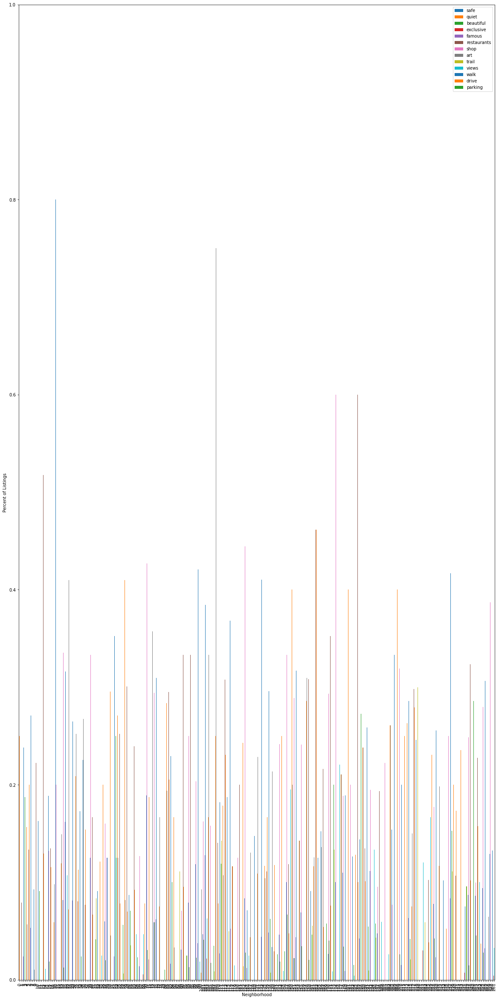

In [18]:
ax = hood_words.plot.bar(stacked=False, figsize=(20,42))
ax.set_ylabel('Percent of Listings', fontsize=10)
ax.set_xlabel('Neighborhood', fontsize=10)
ax.set_ylim(0,1)

In [19]:
import geopandas as gpd
hood_poly=gpd.read_file('data/neighbourhoods.geojson')
hood_poly.head()

,neighbourhood,neighbourhood_group,geometry
0,Angeles Crest,Unincorporated Areas,"MULTIPOLYGON (((-118.09667 34.47348, -118.0796..."
1,Acton,Unincorporated Areas,"MULTIPOLYGON (((-118.20703 34.53902, -118.1894..."
2,Agua Dulce,Unincorporated Areas,"MULTIPOLYGON (((-118.37822 34.48811, -118.3783..."
3,Athens,Unincorporated Areas,"MULTIPOLYGON (((-118.29152 33.93096, -118.2916..."
4,Alondra Park,Unincorporated Areas,"MULTIPOLYGON (((-118.32651 33.89757, -118.3264..."


In [20]:
merged_hood_words = pd.merge(left=hood_poly, right=hood_words, left_on='neighbourhood', right_on='neighbourhood_cleansed')
merged_hood_words.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 262 entries, 0 to 261
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   neighbourhood           262 non-null    object  
 1   neighbourhood_group     262 non-null    object  
 2   geometry                262 non-null    geometry
 3   neighbourhood_cleansed  262 non-null    object  
 4   safe                    262 non-null    float64 
 5   quiet                   262 non-null    float64 
 6   beautiful               262 non-null    float64 
 7   exclusive               262 non-null    float64 
 8   famous                  262 non-null    float64 
 9   restaurants             262 non-null    float64 
 10  shop                    262 non-null    float64 
 11  art                     262 non-null    float64 
 12  trail                   262 non-null    float64 
 13  views                   262 non-null    float64 
 14  walk              

## 1.2 mapping full data set neighborhoods

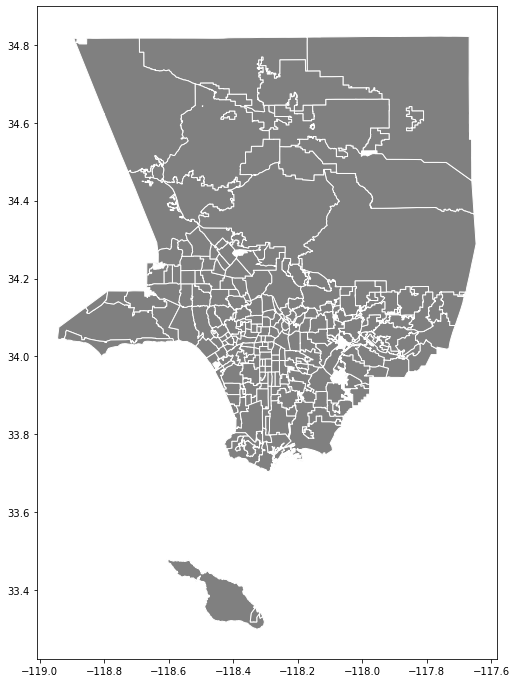

In [21]:
ax= merged_hood_words.plot(figsize=(12,12), 
            color='grey', edgecolor='white')

[]

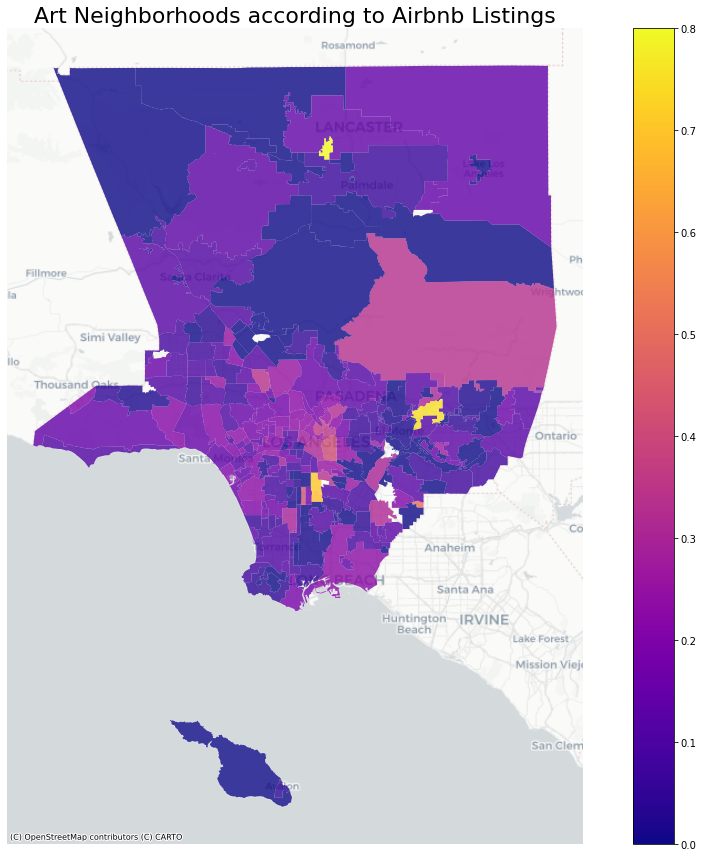

In [22]:
# Now we plot it on a map with a different color gradient
merged_hood_words = merged_hood_words.to_crs(epsg=3857)
ax = merged_hood_words.plot(figsize=(18,15),
                        column='art',
                        legend=True,
                        alpha=0.8,
                        cmap='plasma',    
                        vmin=0)

ax.axis('off')
ax.set_title('Art Neighborhoods according to Airbnb Listings',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.plot()

In [23]:
# try a folium map

import folium

cal = folium.Map(location=[34,-118.2],tiles='cartodbpositron',)

# choropleth map of percent
folium.Choropleth(
    merged_hood_words, # the geodataframe
    data=merged_hood_words, # the data is in the geodataframe, so same value
    key_on= 'feature.properties.neighbourhood',# the id column
    columns=['neighbourhood', 'walk'], # the id column, followed by the variable to map
    fill_color='BuPu', # color scheme
    fill_opacity=0.8, 
    line_opacity=0.1, 
    legend_name="Percent of listings with the word walk",
    name="Walkable Neighborhoods according to Airbnb Listings", # name the layer
    vmin=0,
).add_to(cal)

# output the map
cal

In [24]:
# try a folium map

import folium

cal = folium.Map(location=[34,-118.2],tiles='cartodbpositron',)

# choropleth map of percent
folium.Choropleth(
    merged_hood_words, # the geodataframe
    data=merged_hood_words, # the data is in the geodataframe, so same value
    key_on= 'feature.properties.neighbourhood',# the id column
    columns=['neighbourhood', 'shop'], # the id column, followed by the variable to map
    fill_color='BuPu', # color scheme
    fill_opacity=0.8, 
    line_opacity=0.1, 
    legend_name="Percent of listings with the word shop",
    name="Shop Neighborhoods according to Airbnb Listings", # name the layer
    vmin=0,
).add_to(cal)

# output the map
cal

In [25]:
merged_hood_words.sort_values(by=['walk'])

,neighbourhood,neighbourhood_group,geometry,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Angeles Crest,Unincorporated Areas,"MULTIPOLYGON (((-13146461.169 4092557.670, -13...",Angeles Crest,0.000000,0.333333,0.000000,0.000,0.000000,0.000000,0.000000,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000
61,Northwest Palmdale,Unincorporated Areas,"MULTIPOLYGON (((-13153076.997 4115847.376, -13...",Northwest Palmdale,0.250000,0.125000,0.000000,0.125,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
31,Mayflower Village,Unincorporated Areas,"MULTIPOLYGON (((-13136139.848 4046311.043, -13...",Mayflower Village,0.029412,0.088235,0.000000,0.000,0.000000,0.029412,0.088235,0.088235,0.029412,0.000000,0.000000,0.117647,0.000000
126,Ridge Route,Unincorporated Areas,"MULTIPOLYGON (((-13205713.305 4096306.806, -13...",Ridge Route,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
33,Lopez/Kagel Canyons,Unincorporated Areas,"MULTIPOLYGON (((-13177556.042 4071713.012, -13...",Lopez/Kagel Canyons,0.000000,0.000000,0.250000,0.000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,San Fernando,Other Cities,"MULTIPOLYGON (((-13182840.044 4068660.571, -13...",San Fernando,0.000000,0.100000,0.000000,0.000,0.000000,0.600000,0.000000,0.000000,0.000000,0.000000,0.500000,0.100000,0.000000
165,Atwater Village,City of Los Angeles,"MULTIPOLYGON (((-13164421.344 4045216.141, -13...",Atwater Village,0.082353,0.105882,0.070588,0.000,0.035294,0.517647,0.505882,0.176471,0.058824,0.011765,0.505882,0.129412,0.011765
151,Highland Park,City of Los Angeles,"MULTIPOLYGON (((-13156753.435 4046517.475, -13...",Highland Park,0.018634,0.062112,0.111801,0.000,0.031056,0.465839,0.347826,0.322981,0.012422,0.018634,0.509317,0.124224,0.018634
11,Citrus,Unincorporated Areas,"MULTIPOLYGON (((-13124981.182 4044056.538, -13...",Citrus,0.000000,0.200000,0.000000,0.000,0.000000,0.200000,0.400000,0.000000,0.000000,0.000000,0.600000,0.000000,0.000000


# 2. Just focus on the gentrifying neighborhoods


In [26]:
gent_df = pd.read_csv('data/join_list_gent.csv')
gent_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2218 entries, 0 to 2217
Data columns (total 90 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            2218 non-null   int64  
 1   listing_url                                   2218 non-null   object 
 2   scrape_id                                     2218 non-null   int64  
 3   last_scraped                                  2218 non-null   object 
 4   name_left                                     2218 non-null   object 
 5   description                                   2117 non-null   object 
 6   neighborhood_overview                         1326 non-null   object 
 7   picture_url                                   2218 non-null   object 
 8   host_id                                       2218 non-null   int64  
 9   host_url                                      2218 non-null   o

In [27]:
# convert to string and lower case
gent_df['neighborhood_overview']=gent_df.neighborhood_overview.astype(str)
gent_df['neighborhood_overview']=gent_df.neighborhood_overview.str.lower()

for i in range(length):
    gent_df[list[i]]=gent_df.neighborhood_overview.apply(lambda x: check_words(x,list[i]))
    
gent_df.sample(20)

,id,listing_url,scrape_id,last_scraped,name_left,description,neighborhood_overview,picture_url,host_id,host_url,...,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
265,39366746,https://www.airbnb.com/rooms/39366746,20210207181900,2021-02-09,Modern Artist House with Pod Beds and Theater!,We are a month-to-month shared living setup sp...,nan,https://a0.muscache.com/pictures/d1716040-138e...,174642927,https://www.airbnb.com/users/show/174642927,...,False,False,False,False,False,False,False,False,False,False
139,23311156,https://www.airbnb.com/rooms/23311156,20210207181900,2021-02-09,Classic LA Bungalow 3 bed in Trendy East Holly...,"This classic LA ""Spanish Deco"" bungalow was lo...",walking distance:<br /> - upright citizen's br...,https://a0.muscache.com/pictures/24c90b9f-bc9f...,400289,https://www.airbnb.com/users/show/400289,...,False,False,True,True,True,False,False,True,False,False
505,16260863,https://www.airbnb.com/rooms/16260863,20210207181900,2021-02-09,Dancers at Millennium/Movement NoHo Arts District,Our rooms are warm and friendly! We can accomm...,the north hollywood arts district is one of la...,https://a0.muscache.com/pictures/b261a2ca-99f8...,74722705,https://www.airbnb.com/users/show/74722705,...,False,False,False,True,True,False,False,True,False,False
1621,5241802,https://www.airbnb.com/rooms/5241802,20210207181900,2021-02-10,Beautiful garden retreat.,Cozy hilltop guest-house conveniently located ...,city terrace is a sunny residential hilltop ne...,https://a0.muscache.com/pictures/65512611/6a9b...,27128299,https://www.airbnb.com/users/show/27128299,...,False,False,True,False,False,False,False,False,False,False
1356,21752969,https://www.airbnb.com/rooms/21752969,20210207181900,2021-02-10,Cozy 1 bedroom in the heart of city Alhambra,Small one bedroom have all you need for a 2 or...,"quite and nice , you will feel like to walking...",https://a0.muscache.com/pictures/054b59cb-d824...,47788766,https://www.airbnb.com/users/show/47788766,...,False,False,False,False,False,False,False,True,False,False
169,28009454,https://www.airbnb.com/rooms/28009454,20210207181900,2021-02-08,Large Studio w. Parking! Walk to Best of Los F...,"Warm, large studio ready for a perfect stay. I...","location, location, location! <br />apartment ...",https://a0.muscache.com/pictures/9f79d67d-c174...,15957836,https://www.airbnb.com/users/show/15957836,...,False,False,False,True,True,False,False,True,False,False
735,45832384,https://www.airbnb.com/rooms/45832384,20210207181900,2021-02-09,Renovated Loft Next to Bars and Restaurants,Universal Studios is only 6 minutes away!<br /...,noho arts district is a very hip area. even du...,https://a0.muscache.com/pictures/a26017c6-2160...,35019754,https://www.airbnb.com/users/show/35019754,...,False,False,False,False,True,False,False,True,False,False
216,35576387,https://www.airbnb.com/rooms/35576387,20210207181900,2021-02-09,106-Hollywood Marilyn Monroe Industrial style apt,Welcome to newly designed industrial style apa...,"this is prime west hollywood: walkable, green,...",https://a0.muscache.com/pictures/38ba6775-b683...,229603019,https://www.airbnb.com/users/show/229603019,...,False,False,True,True,True,False,False,True,False,False
1893,27240382,https://www.airbnb.com/rooms/27240382,20210207181900,2021-02-08,Cozy holiday feeling home+swimming pool 家庭风格温馨度假风,The swimming pool is close due to Covid-19<br ...,nan,https://a0.muscache.com/pictures/0055fc23-3568...,39367618,https://www.airbnb.com/users/show/39367618,...,False,False,False,False,False,False,False,False,False,False
1030,34662383,https://www.airbnb.com/rooms/34662383,20210207181900,2021-02-09,"Clean, Updated 1 BDRM Suite. 3 miles to LAX & ...","Clean, Updated, 1 BDRM Guest Suite. Convenient...",situated on a quiet street with long term resi...,https://a0.muscache.com/pictures/eef3f474-4c66...,27842033,https://www.airbnb.com/users/show/27842033,...,False,False,True,True,False,False,False,True,True,False


In [28]:
def group_gent(keyword):
    by_hoods = gent_df.groupby("neighbourhood_cleansed")[keyword].mean()
    by_hoods_df = pd.DataFrame(by_hoods).reset_index()
    return by_hoods_df

In [29]:
safe_df = group_gent('safe')
quiet_df = group_gent('quiet')
beautiful_df = group_gent('beautiful')
exclusive_df = group_gent('exclusive')
famous_df = group_gent('famous')
restaurants_df = group_gent('restaurants')
shop_df = group_gent('shop')
art_df = group_gent('art')
trail_df = group_gent('trail')
views_df = group_gent('views')
walk_df = group_gent('walk')
drive_df = group_gent('drive')
parking_df = group_gent('parking')

In [32]:
# join the individual data frames together

hood_words_gent = pd.concat((iDF.set_index('neighbourhood_cleansed') for iDF in [safe_df, quiet_df, beautiful_df, exclusive_df, famous_df, restaurants_df, shop_df, art_df, trail_df, views_df, walk_df, drive_df, parking_df]),
    axis=1, join='inner').reset_index()

hood_words_gent.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   neighbourhood_cleansed  16 non-null     object 
 1   safe                    16 non-null     float64
 2   quiet                   16 non-null     float64
 3   beautiful               16 non-null     float64
 4   exclusive               16 non-null     float64
 5   famous                  16 non-null     float64
 6   restaurants             16 non-null     float64
 7   shop                    16 non-null     float64
 8   art                     16 non-null     float64
 9   trail                   16 non-null     float64
 10  views                   16 non-null     float64
 11  walk                    16 non-null     float64
 12  drive                   16 non-null     float64
 13  parking                 16 non-null     float64
dtypes: float64(13), object(1)
memory usage: 1.9+

In [33]:
hood_words_gent.head(20)

,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Alhambra,0.140000,0.156667,0.016667,0.000000,0.006667,0.180000,0.140000,0.056667,0.000000,0.003333,0.183333,0.046667,0.006667
1,Azusa,0.188679,0.132075,0.018868,0.000000,0.000000,0.132075,0.132075,0.094340,0.132075,0.000000,0.264151,0.000000,0.018868
2,Commerce,0.125000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000
3,East Hollywood,0.045455,0.043062,0.040670,0.000000,0.057416,0.236842,0.181818,0.234450,0.019139,0.007177,0.327751,0.090909,0.031100
4,East Los Angeles,0.054688,0.132812,0.031250,0.000000,0.039062,0.218750,0.109375,0.234375,0.007812,0.046875,0.242188,0.109375,0.007812
5,Hollywood,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
6,Industry,0.060606,0.060606,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,Inglewood,0.096491,0.138158,0.035088,0.002193,0.050439,0.111842,0.138158,0.081140,0.008772,0.015351,0.199561,0.092105,0.013158
8,Larchmont,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000
9,Monterey Park,0.090909,0.114625,0.007905,0.003953,0.000000,0.118577,0.083004,0.059289,0.007905,0.000000,0.083004,0.047431,0.011858


In [34]:
# some extra ones showed up for some reason so let's get rid of Hollywood, Larchmont, and Rosemead
hood_words_gent = hood_words_gent.drop(labels=[5,8,13], axis=0)
hood_words_gent = hood_words_gent.reset_index(drop=True)
hood_words_gent.head(20)

,neighbourhood_cleansed,safe,quiet,beautiful,exclusive,famous,restaurants,shop,art,trail,views,walk,drive,parking
0,Alhambra,0.140000,0.156667,0.016667,0.000000,0.006667,0.180000,0.140000,0.056667,0.000000,0.003333,0.183333,0.046667,0.006667
1,Azusa,0.188679,0.132075,0.018868,0.000000,0.000000,0.132075,0.132075,0.094340,0.132075,0.000000,0.264151,0.000000,0.018868
2,Commerce,0.125000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000,0.000000,0.000000,0.000000,0.125000,0.000000,0.000000
3,East Hollywood,0.045455,0.043062,0.040670,0.000000,0.057416,0.236842,0.181818,0.234450,0.019139,0.007177,0.327751,0.090909,0.031100
4,East Los Angeles,0.054688,0.132812,0.031250,0.000000,0.039062,0.218750,0.109375,0.234375,0.007812,0.046875,0.242188,0.109375,0.007812
5,Industry,0.060606,0.060606,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,Inglewood,0.096491,0.138158,0.035088,0.002193,0.050439,0.111842,0.138158,0.081140,0.008772,0.015351,0.199561,0.092105,0.013158
7,Monterey Park,0.090909,0.114625,0.007905,0.003953,0.000000,0.118577,0.083004,0.059289,0.007905,0.000000,0.083004,0.047431,0.011858
8,North Hollywood,0.113372,0.177326,0.046512,0.000000,0.043605,0.308140,0.186047,0.337209,0.017442,0.005814,0.316860,0.093023,0.043605
9,Pico Rivera,0.138889,0.305556,0.000000,0.000000,0.000000,0.222222,0.388889,0.305556,0.027778,0.000000,0.111111,0.027778,0.083333


In [35]:
merged_genthood_words = pd.merge(left=hood_poly, right=hood_words_gent, left_on='neighbourhood', right_on='neighbourhood_cleansed', how="right")
merged_genthood_words.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 13 entries, 0 to 12
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   neighbourhood           13 non-null     object  
 1   neighbourhood_group     13 non-null     object  
 2   geometry                13 non-null     geometry
 3   neighbourhood_cleansed  13 non-null     object  
 4   safe                    13 non-null     float64 
 5   quiet                   13 non-null     float64 
 6   beautiful               13 non-null     float64 
 7   exclusive               13 non-null     float64 
 8   famous                  13 non-null     float64 
 9   restaurants             13 non-null     float64 
 10  shop                    13 non-null     float64 
 11  art                     13 non-null     float64 
 12  trail                   13 non-null     float64 
 13  views                   13 non-null     float64 
 14  walk                

In [36]:
# try a folium map

cal = folium.Map(location=[34,-118.2],tiles='cartodbpositron',)

# choropleth map of percent
folium.Choropleth(
    merged_genthood_words, # the geodataframe
    data=merged_genthood_words, # the data is in the geodataframe, so same value
    key_on= 'feature.properties.neighbourhood',# the id column
    columns=['neighbourhood', 'walk'], # the id column, followed by the variable to map
    fill_color='BuGn', # color scheme
    fill_opacity=0.4, 
    line_opacity=0.1, 
    legend_name="Percent of listings with the word walk",
    name="Walk Friendly Neighborhoods according to Airbnb", # name the layer
    vmin=0
).add_to(cal)

# output the map
cal

In [37]:
# Group by neighborhood for each of the words
# Words for Adjectives: Safe, Quiet, Beautiful, Exclusive, Famous
# Words for Amenities: Restaurants, Shop, Art, Trail, Views
# Words for Mobility: Walk, Drive, Parking
# try plotly bars https://plotly.com/python/bar-charts/

import plotly.graph_objects as go
hoodnames=merged_genthood_words['neighbourhood']
safe=merged_genthood_words['safe']
beautiful=merged_genthood_words['beautiful']
exclusive=merged_genthood_words['exclusive']
famous=merged_genthood_words['famous']

fig = go.Figure(data=[
    go.Bar(name='safe', x=hoodnames, y=safe),
    go.Bar(name='quiet', x=hoodnames, y=quiet),
    go.Bar(name='beautiful', x=hoodnames, y=beautiful),
    go.Bar(name='exclusive', x=hoodnames, y=exclusive),
    go.Bar(name='famous', x=hoodnames, y=famous),
    ])
# Change the bar mode
fig.update_layout(barmode='group', yaxis_range=[0,.45], title="Gentrifying Neighborhoods: Percent of Airbnb Listings with Selected Adjectives")
fig.show()

In [38]:
# Words for Amenities: Restaurants, Shop, Art, Trail, Views

hoodnames=merged_genthood_words['neighbourhood']
restaurants=merged_genthood_words['restaurants']
shop=merged_genthood_words['shop']
art=merged_genthood_words['art']
trail=merged_genthood_words['trail']
views=merged_genthood_words['views']

fig = go.Figure(data=[
    go.Bar(name='restaurants', x=hoodnames, y=restaurants),
    go.Bar(name='shop', x=hoodnames, y=shop),
    go.Bar(name='art', x=hoodnames, y=art),
    go.Bar(name='trail', x=hoodnames, y=trail),
    go.Bar(name='views', x=hoodnames, y=views),
])
# Change the bar mode
fig.update_layout(barmode='group',yaxis_range=[0,.45],title="Gentrifying Neighborhoods: Percent of Airbnb Listings with Selected Amenities")
fig.show()

In [39]:
# Words for for Mobility: Walk, Drive, Parking

hoodnames=merged_genthood_words['neighbourhood']
restaurants=merged_genthood_words['restaurants']
walk=merged_genthood_words['walk']
drive=merged_genthood_words['drive']
parking=merged_genthood_words['parking']

fig = go.Figure(data=[
    go.Bar(name='walk', x=hoodnames, y=walk),
    go.Bar(name='drive', x=hoodnames, y=drive),
    go.Bar(name='parking', x=hoodnames, y=parking),
])
# Change the bar mode
fig.update_layout(barmode='group', yaxis_range=[0,.45], title="Gentrifying Neighborhoods: Percent of Airbnb Listings with Selected Mobility Keywords")
fig.show()